In [2]:
!pip install PyDrive

from google.colab import drive
drive.mount('/content/drive')
!ls "/content/drive/My Drive/Colab Notebooks/GAN"

    100% |████████████████████████████████| 993kB 19.8MB/s 
  Stored in directory: /root/.cache/pip/wheels/fa/d2/9a/d3b6b506c2da98289e5d417215ce34b696db856643bad779f4
Successfully built PyDrive
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive
celeba	 dcgan-G	svhn		     wgp_dcgan-D
dcgan-D  dcgan_samples	Ver1_DCGAN_GP.ipynb  wgp_dcgan-G


In [3]:
!ls "/content"

drive  sample_data


### DCGAN adapted from :
https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html#generative-adversarial-networks

### with WGAN-GP objective

In [4]:
%matplotlib inline

from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [0]:
# Root directory for dataset
dataroot = "/content/drive/My Drive/Colab Notebooks/GAN/svhn/"

# Number of workers for dataloader
workers = 4

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 32

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Number of training epochs
num_epochs = 50

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [6]:
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
from torch.utils.data import dataset
import torchvision.datasets as dset
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML




datapath = '/content/drive/My Drive/Colab Notebooks/GAN/svhn'

image_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((.5, .5, .5),
                         (.5, .5, .5))
])


def get_data_loader(dataset_location, batch_size):
    trainvalid = torchvision.datasets.SVHN(
        dataset_location, split='train',
        download=True,
        transform=image_transform
    )

    trainset_size = int(len(trainvalid) * 0.9)
    trainset, validset = dataset.random_split(
        trainvalid,
        [trainset_size, len(trainvalid) - trainset_size]
    )

    trainloader = torch.utils.data.DataLoader(
        trainset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=2
    )

    validloader = torch.utils.data.DataLoader(
        validset,
        batch_size=batch_size,
    )

    testloader = torch.utils.data.DataLoader(
        torchvision.datasets.SVHN(
            dataset_location, split='test',
            download=True,
            transform=image_transform
        ),
        batch_size=batch_size,
    )

    return trainloader, validloader, testloader

trainloader, validloader, testloader = get_data_loader(datapath, batch_size)


# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


Using downloaded and verified file: /content/drive/My Drive/Colab Notebooks/GAN/svhn/train_32x32.mat
Using downloaded and verified file: /content/drive/My Drive/Colab Notebooks/GAN/svhn/test_32x32.mat


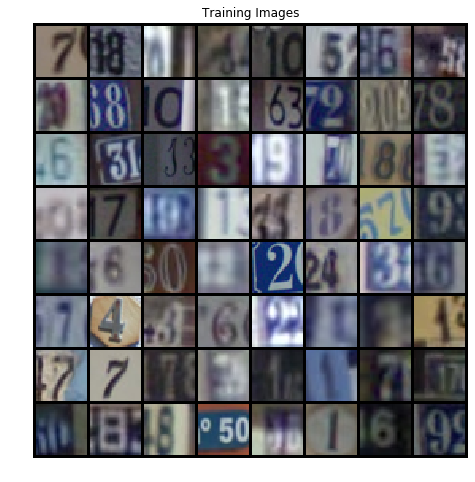

In [7]:
# Plot some training images
real_batch = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:batch_size], padding=2, normalize=True),(1,2,0)))

# Nouvelle section

# Nouvelle section

In [0]:
def dcgan_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
class Generator(nn.Module):

    def __init__(self, f=32):
        super(Generator, self).__init__()

        # base depth nb of feature maps
        self.f = f

        def dc_block(in_size, out_size, k=4, s=2, p=1):
            return nn.Sequential(
                nn.ConvTranspose2d(in_size, out_size, k, s, p, bias=False),
                nn.BatchNorm2d(out_size),
                nn.ReLU(True))

        self.main = nn.Sequential(
            dc_block(100, self.f * 8, 2, 1, 0),
            dc_block(self.f * 8, self.f * 4),
            dc_block(self.f * 4, self.f * 2),
            dc_block(self.f * 2, self.f),
            nn.ConvTranspose2d(self.f, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )


    def forward(self, z):
        return self.main(z)

In [10]:
from torchsummary import summary

# Create the generator
netG = Generator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(dcgan_init)

noise = torch.randn(64, nz, 1, 1, device=device)

# Print the model
print(netG)
summary(netG, (100,1,1))

Generator(
  (main): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 256, kernel_size=(2, 2), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (1): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (2): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (3): Sequential(
      (0): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (4): Con

In [0]:
class Discriminator(nn.Module):
    def __init__(self, f=32):
        super(Discriminator, self).__init__()

        # base nb of feature maps
        self.f = f

        def conv_block(in_size, out_size, k=4, s=2, p=1):
            return nn.Sequential(
                nn.Conv2d(in_size, out_size, k, s, p, bias=False),
                nn.InstanceNorm2d(out_size, affine=True),  # No batch norm for WGAN-GP
                nn.LeakyReLU(0.2))

        self.main = nn.Sequential(
            nn.Conv2d(3, self.f, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2),

            conv_block(self.f, self.f * 2),
            conv_block(self.f * 2, self.f * 4),
            conv_block(self.f * 4, self.f * 8),

            nn.Conv2d(self.f * 8, 1, 2, 1, 0, bias=False),
            # nn.Sigmoid()  # Remove Sigmoid for WGAN-GP objective
        )

    def forward(self, x):
        return self.main(x)

In [12]:
# Create the Discriminator
netD = Discriminator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netD.apply(dcgan_init)

# Print the model
print(netD)
summary(netD, (3,32,32))

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(256, 1, kernel_size=(2, 2), stride=(1, 1), bias=False)
  )
)


In [0]:
from torch.autograd import grad
from torch.autograd import Variable


# Gradient Penalty : https://arxiv.org/pdf/1704.00028.pdf 4.0
# takes in one batch of real and fake data
def gradient_penalty(D, real, fake, lamda =10):
        assert real.size() == fake.size()
        alpha = torch.rand(real.size(0), 1).to(device)
        alpha = alpha\
            .expand(real.size(0), real.nelement()//real.size(0))\
            .contiguous().view(real.size(0),nc, image_size, image_size)
        
        x_hat = Variable(alpha*real.data + (1-alpha)*fake.data, requires_grad=True)
        D_x = D(x_hat)
        
        # https://discuss.pytorch.org/t/gradient-penalty-with-respect-to-the-network-parameters/11944/5
        gradients = grad(D_x, x_hat, 
                grad_outputs=(torch.ones(D_x.size()).to(device)),
                create_graph=True,
                retain_graph=True,)[0]
                        # adding a small notch for numerical stability
        return lamda * ((1-(gradients+1e-12).norm(2, dim=1))**2).mean()

In [0]:
# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [15]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
D_iters = 0

D_step = 5

print("Starting Training Loop...")
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(trainloader, 0):
        
        
        ## Discriminator with WGAN-GP objective
        netD.zero_grad()
        
        # real
        real = data[0].to(device)
        b_size = real.size(0)
        label = torch.full((b_size,), real_label, device=device)
        D_real = netD(real).view(-1)
        
        # fake
        sample_z = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(sample_z)
        label.fill_(fake_label)
        D_fake = netD(fake.detach()).view(-1)
        
        
        # WGAN-GP Objective loss
        penalty = gradient_penalty(netD, real, fake)
        D_loss = D_fake.mean() - D_real.mean() + penalty
        
        D_loss.backward(retain_graph=True)
        
        D_x = D_real.mean()
        G_loss = - D_fake.mean()
        D_G_z1 = D_fake.mean().item()
        D_G_z2 = D_fake.mean().item()
        optimizerD.step()
        D_iters += 1

        ## Generator
        # 
        if D_iters % D_step == 0:
          netG.zero_grad()
          label.fill_(real_label)
          D_fake = netD(fake).view(-1)

          G_loss = - D_fake.mean()
          G_loss.backward()

          D_G_z2 = D_fake.mean().item()
          optimizerG.step()
        
        
        # Output training stats
        if i % 100 == 0:
            print('[%d/%d][%4d/%4d]\tLoss_D: %4.2f\tLoss_G: %4.2f\tD(x): %4.2f\tD(G(z)): %4.2f / %.4f'
                  % (epoch + 1, num_epochs, i, len(trainloader),
                     D_loss.item(), G_loss.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(G_loss.item())
        D_losses.append(D_loss.item())
      
        iters += 1
    
    # saving fixed sample images
    with torch.no_grad():
      fake = netG(fixed_noise).detach().cpu()
      img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
      

Starting Training Loop...
[1/50][   0/1031]	Loss_D: 8.08	Loss_G: 0.11	D(x): -0.03	D(G(z)): -0.11 / -0.1082
[1/50][ 100/1031]	Loss_D: -11.76	Loss_G: 5.58	D(x): 11.13	D(G(z)): -5.58 / -5.5791
[1/50][ 200/1031]	Loss_D: -34.16	Loss_G: 18.08	D(x): 20.66	D(G(z)): -18.08 / -18.0797
[1/50][ 300/1031]	Loss_D: -49.08	Loss_G: 23.86	D(x): 30.47	D(G(z)): -23.86 / -23.8611
[1/50][ 400/1031]	Loss_D: -74.33	Loss_G: 40.67	D(x): 40.08	D(G(z)): -40.67 / -40.6660
[1/50][ 500/1031]	Loss_D: -26.35	Loss_G: -20.91	D(x): 53.43	D(G(z)): 20.91 / 20.9088
[1/50][ 600/1031]	Loss_D: -126.98	Loss_G: 68.24	D(x): 68.35	D(G(z)): -68.24 / -68.2409
[1/50][ 700/1031]	Loss_D: -138.36	Loss_G: 64.89	D(x): 81.57	D(G(z)): -64.89 / -64.8874
[1/50][ 800/1031]	Loss_D: -136.64	Loss_G: 65.13	D(x): 90.33	D(G(z)): -65.13 / -65.1304
[1/50][ 900/1031]	Loss_D: -170.16	Loss_G: 94.33	D(x): 105.57	D(G(z)): -94.33 / -94.3331
[1/50][1000/1031]	Loss_D: -201.70	Loss_G: 114.14	D(x): 107.55	D(G(z)): -114.14 / -114.1406
[2/50][   0/1031]	Loss_D: -

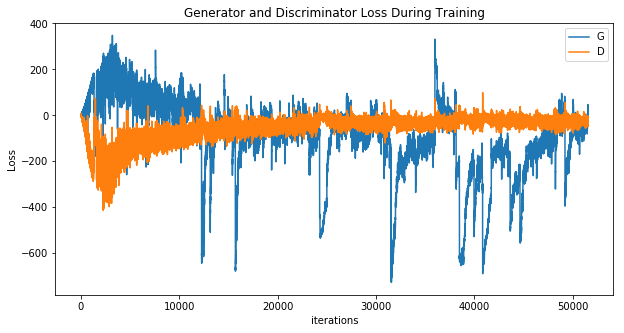

In [16]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

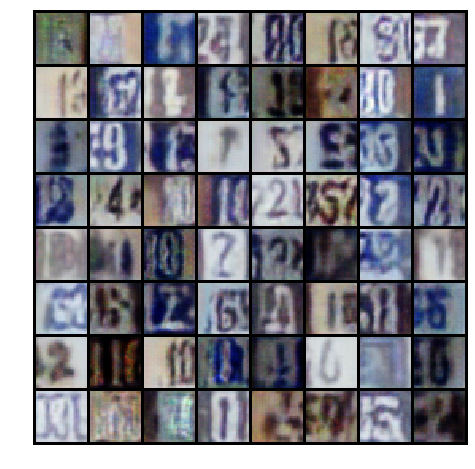

In [17]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

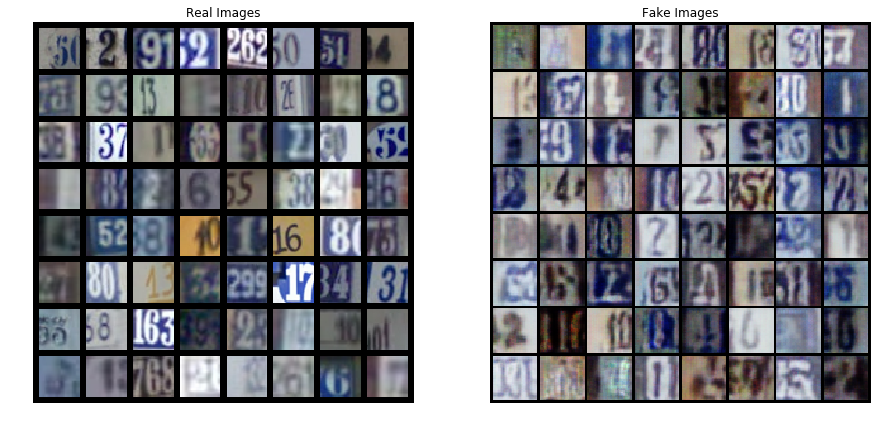

In [18]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(trainloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:batch_size], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [19]:
len(img_list)

50

In [0]:
G_filename = '/content/drive/My Drive/Colab Notebooks/GAN/wgp_dcgan-G'

torch.save(netG.state_dict(), G_filename)

D_filename = '/content/drive/My Drive/Colab Notebooks/GAN/wgp_dcgan-D'

torch.save(netD.state_dict(), D_filename)


In [0]:
import os

def save_samples(dir):
    G =  Generator().to(device)
    G.load_state_dict(torch.load(G_filename))
    G.eval()
    
    for p in G.parameters():
        p.requires_grad = False

    for i in range(10):
        print(i)
        noise = torch.randn(100, nz, 1, 1, device=device)
        images = G(noise)
        os.makedirs(f"{dir}/img/", exist_ok=True)
        for j, image in enumerate(images):
            filename = f"{dir}/img/{i * 100 + j:03d}.png"
            torchvision.utils.save_image(image, filename, normalize=True)

In [24]:
wgp_dcgan_samples = '/content/drive/My Drive/Colab Notebooks/GAN/wgp_dcgan_samples'

save_samples(wgp_dcgan_samples)

0
1
2
3
4
5
6
7
8
9
